In [17]:
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [18]:
sns.set(style="whitegrid")
plt.style.use('seaborn-v0_8-whitegrid')
pd.set_option('display.max_columns', None)
np.random.seed(42)

In [19]:
#import cleaned csv
df = pd.read_csv('../datasets/cleaned/cleaned_private.csv')

In [20]:
#data preprocession within the df
#convert sale date to datetime format
df['Sale Date'] = pd.to_datetime(df['Sale Date'])

# extract year and month for time analysis
df['Sale Year'] = df['Sale Date'].dt.year
df['Sale Month'] = df['Sale Date'].dt.month
df['Sale Quarter'] = df['Sale Date'].dt.quarter
df['YearMonth'] = df['Sale Date'].dt.strftime('%Y-%m')
df['YearQuarter'] = df['Sale Year'].astype(str) + '-Q' + df['Sale Quarter'].astype(str)

In [21]:
#remove outliers function
def remove_outliers(df, column, multiplier=1.5):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - multiplier * IQR
    upper_bound = Q3 + multiplier * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

#create a copy of the dataframe and remove price outliers
df_no_outliers = df.copy()
df_no_outliers = remove_outliers(df_no_outliers, 'Price')

#group by year-month
monthly_price = df.groupby('YearMonth')['Price'].agg(['mean', 'median', 'count']).reset_index()
monthly_price.columns = ['YearMonth', 'Mean Price', 'Median Price', 'Transaction Count']

#group by year-month with outliers removed
monthly_price_clean = df_no_outliers.groupby('YearMonth')['Price'].agg(['mean', 'median', 'count']).reset_index()
monthly_price_clean.columns = ['YearMonth', 'Mean Price', 'Median Price', 'Transaction Count']

# Time VS Price 

In [22]:
# create interactive time vs price plot
fig_price_time = make_subplots(specs=[[{"secondary_y": True}]])
#add hover effects
fig_price_time.add_trace(
    go.Scatter(
        x=monthly_price['YearMonth'], 
        y=monthly_price['Mean Price'],
        name="Mean Price", 
        line=dict(color='#1f77b4', width=3, dash='solid'),
        mode='lines+markers',
        marker=dict(size=6, symbol='circle', line=dict(width=1, color='#1f77b4')),
        hovertemplate='<b>%{x}</b><br>Mean Price: SGD %{y:,.0f}<extra></extra>'
    ),
    secondary_y=False,
)
fig_price_time.add_trace(
    go.Scatter(
        x=monthly_price['YearMonth'], 
        y=monthly_price['Median Price'],
        name="Median Price", 
        line=dict(color='#2ca02c', width=3, dash='solid'),
        mode='lines+markers',
        marker=dict(size=6, symbol='circle', line=dict(width=1, color='#2ca02c')),
        hovertemplate='<b>%{x}</b><br>Median Price: SGD %{y:,.0f}<extra></extra>'
    ),
    secondary_y=False,
)

# add transaction count
fig_price_time.add_trace(
    go.Bar(
        x=monthly_price['YearMonth'], 
        y=monthly_price['Transaction Count'],
        name="Transaction Count", 
        marker=dict(
            color='rgba(158, 202, 225, 0.6)',
            line=dict(color='rgba(8, 48, 107, 0.7)', width=1)
        ),
        hovertemplate='<b>%{x}</b><br>Transactions: %{y:,}<extra></extra>'
    ),
    secondary_y=True,
)

# update layout
fig_price_time.update_layout(
    title=dict(
        text="Singapore Private Housing: Price Trends Over Time",
        font=dict(size=24, family="Arial", color="#333"),
        x=0.5,
        y=0.95
    ),
    xaxis=dict(
        title="Time (Year-Month)",
        titlefont=dict(size=16, family="Arial", color="#333"),
        tickfont=dict(size=12, family="Arial", color="#333"),
        tickangle=45,
        type='category',
        showgrid=True,
        gridcolor='rgba(230, 230, 230, 0.8)'
    ),
    yaxis=dict(
        title="Price (SGD)",
        titlefont=dict(size=16, family="Arial", color="#333"),
        tickfont=dict(size=12, family="Arial", color="#333"),
        showgrid=True,
        gridcolor='rgba(230, 230, 230, 0.8)',
        tickformat=",.0f",
        zeroline=False
    ),
    yaxis2=dict(
        title="Number of Transactions",
        titlefont=dict(size=16, family="Arial", color="#333"),
        tickfont=dict(size=12, family="Arial", color="#333"),
        zeroline=False
    ),
    legend=dict(
        orientation="h", 
        yanchor="bottom", 
        y=1.02, 
        xanchor="center", 
        x=0.5,
        font=dict(size=14, family="Arial"),
        bgcolor='rgba(255, 255, 255, 0.8)',
        bordercolor='rgba(0, 0, 0, 0.1)',
        borderwidth=1
    ),
    template='plotly_white',
    height=700,
    width=1000,
    margin=dict(l=80, r=80, t=100, b=80),
    plot_bgcolor='white',
    paper_bgcolor='white',
    hovermode='closest',
    annotations=[
        dict(
            text="Source: Singapore Housing Data",
            showarrow=False,
            xref="paper",
            yref="paper",
            x=0.02,
            y=-0.13,
            font=dict(size=12, color="#666")
        )
    ]
)

# add grid lines
fig_price_time.update_xaxes(showline=True, linewidth=1, linecolor='rgba(0, 0, 0, 0.2)')
fig_price_time.update_yaxes(showline=True, linewidth=1, linecolor='rgba(0, 0, 0, 0.2)', secondary_y=False)
fig_price_time.update_yaxes(showline=True, linewidth=1, linecolor='rgba(0, 0, 0, 0.2)', secondary_y=True)

# display time series figure
fig_price_time.show()

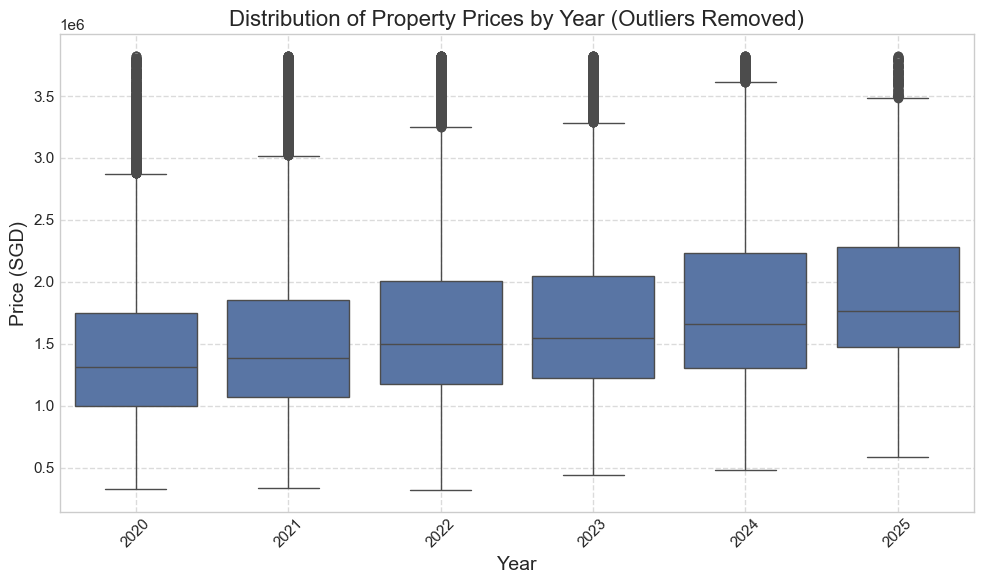

Removed 10023 outliers


In [23]:
# create interactive time vs price plot without outliers
fig_price_time_clean = make_subplots(specs=[[{"secondary_y": True}]])

fig_price_time_clean.add_trace(
    go.Scatter(x=monthly_price_clean['YearMonth'], y=monthly_price_clean['Mean Price'], 
              name="Mean Price (No Outliers)", line=dict(color='blue', width=2)),
    secondary_y=False,
)

fig_price_time_clean.add_trace(
    go.Scatter(x=monthly_price_clean['YearMonth'], y=monthly_price_clean['Median Price'], 
              name="Median Price (No Outliers)", line=dict(color='green', width=2)),
    secondary_y=False,
)

fig_price_time_clean.add_trace(
    go.Bar(x=monthly_price_clean['YearMonth'], y=monthly_price_clean['Transaction Count'], 
           name="Transaction Count", marker=dict(color='rgba(220, 220, 220, 0.7)')),
    secondary_y=True,
)

fig_price_time_clean.update_layout(
    title_text="Singapore Private Housing: Price Trends Over Time (Outliers Removed)",
    xaxis=dict(
        title="Time (Year-Month)",
        tickangle=45,
        type='category'
    ),
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    template='plotly_white',
    height=600
)

fig_price_time_clean.update_yaxes(title_text="Price (SGD)", secondary_y=False)
fig_price_time_clean.update_yaxes(title_text="Number of Transactions", secondary_y=True)

fig_price_time_clean.show()

# create a boxplot without outliers to compare distribution
plt.figure(figsize=(10, 6))
sns.boxplot(x='Sale Year', y='Price', data=df_no_outliers)
plt.title('Distribution of Property Prices by Year (Outliers Removed)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Price (SGD)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# print stats about how many outliers were removed
outliers_count = len(df) - len(df_no_outliers)
print(f"Removed {outliers_count} outliers")

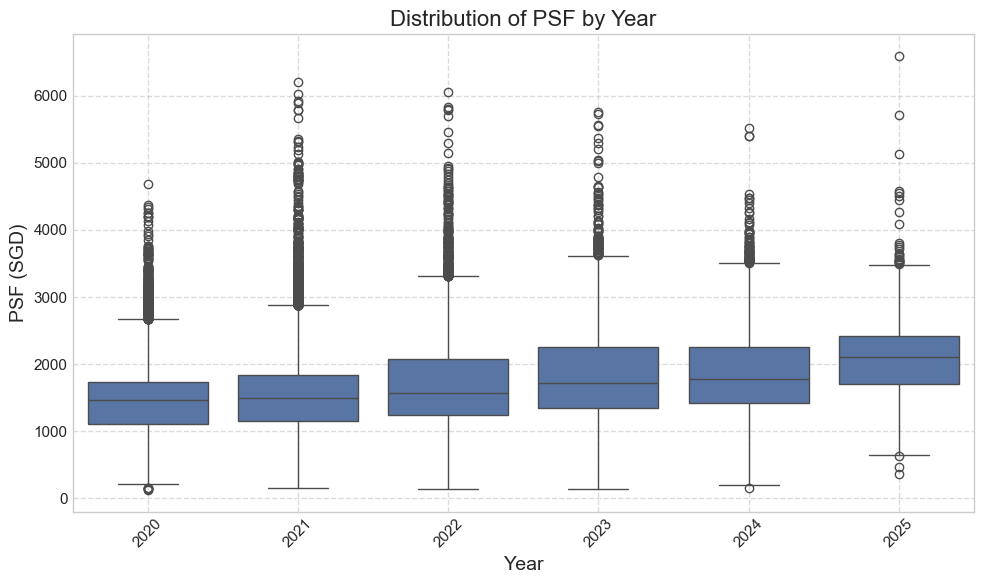

In [24]:
monthly_psf = df.groupby('YearMonth')['Unit Price ($ PSF)'].agg(['mean', 'median', 'count']).reset_index()
monthly_psf.columns = ['YearMonth', 'Mean PSF', 'Median PSF', 'Transaction Count']

# create interactive time vs PSF plot
fig_psf_time = make_subplots(specs=[[{"secondary_y": True}]])

# add PSF trends
fig_psf_time.add_trace(
    go.Scatter(x=monthly_psf['YearMonth'], y=monthly_psf['Mean PSF'], 
                name="Mean PSF", line=dict(color='red', width=2)),
    secondary_y=False,
)

fig_psf_time.add_trace(
    go.Scatter(x=monthly_psf['YearMonth'], y=monthly_psf['Median PSF'], 
                name="Median PSF", line=dict(color='orange', width=2)),
    secondary_y=False,
)

# add transaction volume
fig_psf_time.add_trace(
    go.Bar(x=monthly_psf['YearMonth'], y=monthly_psf['Transaction Count'], 
            name="Transaction Count", marker=dict(color='rgba(220, 220, 220, 0.7)')),
    secondary_y=True,
)

# update layout
fig_psf_time.update_layout(
    title_text="Singapore Private Housing: Price Per Square Foot (PSF) Trends Over Time",
    xaxis=dict(
        title="Time (Year-Month)",
        tickangle=45,
        type='category'
    ),
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
    template='plotly_white',
    height=600
)

# y-axes titles
fig_psf_time.update_yaxes(title_text="Price per Square Foot (SGD)", secondary_y=False)
fig_psf_time.update_yaxes(title_text="Number of Transactions", secondary_y=True)

fig_psf_time.show()

# box plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='Sale Year', y='Unit Price ($ PSF)', data=df)
plt.title('Distribution of PSF by Year', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('PSF (SGD)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Market segment Analysis


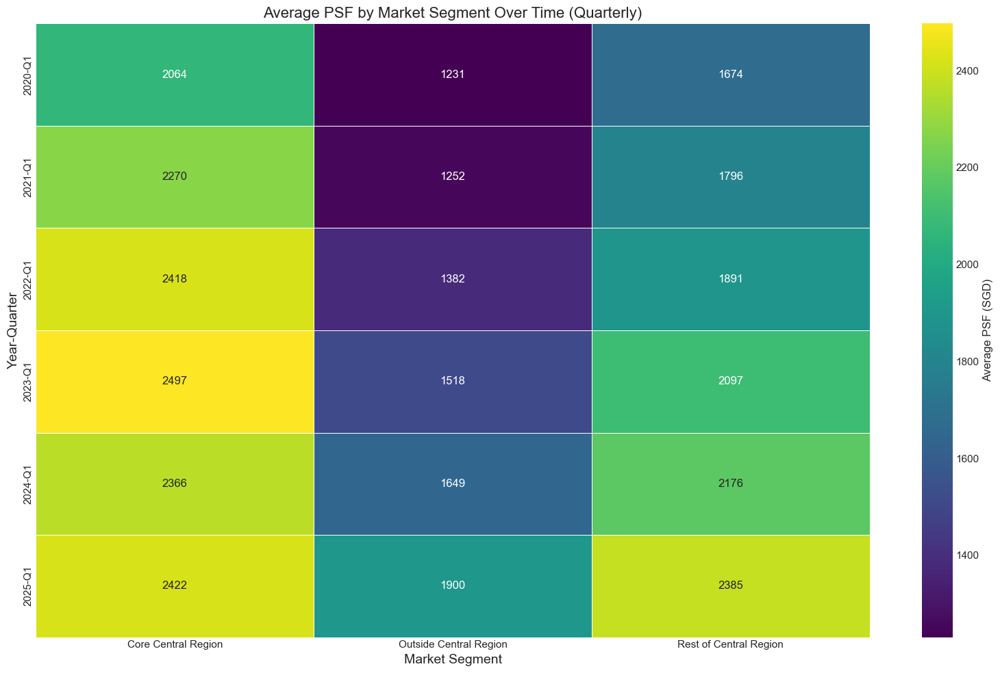

In [25]:
segment_time = df.groupby(['YearQuarter', 'Market Segment'])['Unit Price ($ PSF)'].mean().reset_index()
segment_time_pivot = segment_time.pivot(index='YearQuarter', columns='Market Segment', values='Unit Price ($ PSF)')

# create plot
plt.figure(figsize=(16, 10))
sns.heatmap(segment_time_pivot, annot=True, fmt='.0f', cmap='viridis', linewidths=.5, cbar_kws={'label': 'Average PSF (SGD)'})
plt.title('Average PSF by Market Segment Over Time (Quarterly)', fontsize=16)
plt.ylabel('Year-Quarter', fontsize=14)
plt.xlabel('Market Segment', fontsize=14)
plt.tight_layout()
plt.show()

# Property Type Analysis

In [26]:
property_time = df.groupby(['YearQuarter', 'Property Type'])['Unit Price ($ PSF)'].mean().reset_index()

fig_property = px.line(property_time, x='YearQuarter', y='Unit Price ($ PSF)', color='Property Type',
                title='PSF Trends by Property Type',
                labels={'Unit Price ($ PSF)': 'Average PSF (SGD)', 'YearQuarter': 'Year-Quarter'},
                markers=True, line_shape='linear', template='plotly_white',
                height=600)

fig_property.update_layout(
    xaxis=dict(title="Time (Year-Quarter)", tickangle=45, type='category'),
    legend=dict(title="Property Type"),
    hovermode="x unified"
)

fig_property.show()

property_price_time = df.groupby(['YearQuarter', 'Property Type'])['Price'].mean().reset_index()

fig_property_price = px.line(property_price_time, 
                             x='YearQuarter', 
                             y='Price', 
                             color='Property Type',
                             title='Transaction Price Trends by Property Type',
                             labels={'Price ($)': 'Average Transaction Price (SGD)', 
                                    'YearQuarter': 'Year-Quarter'},
                             markers=True, 
                             line_shape='linear', 
                             template='plotly_white',
                             height=600)

fig_property_price.update_layout(
    xaxis=dict(title="Time (Year-Quarter)", tickangle=45, type='category'),
    legend=dict(title="Property Type"),
    hovermode="x unified"
)

fig_property_price.show()

# Type of Sale Analysis

In [27]:
sale_type_price_time = df.groupby(['YearQuarter', 'Type of Sale'])['Price'].mean().reset_index()

fig_sale_type_price = px.line(sale_type_price_time, 
                              x='YearQuarter', 
                              y= 'Price', 
                              color='Type of Sale',
                              title='Transaction Price Trends by Type of Sale',
                              labels={'Transacted Price ($)': 'Average Transaction Price (SGD)', 
                                     'YearQuarter': 'Year-Quarter'},
                              markers=True, 
                              line_shape='linear', 
                              template='plotly_white',
                              height=600)

fig_sale_type_price.update_layout(
    xaxis=dict(title="Time (Year-Quarter)", tickangle=45, type='category'),
    legend=dict(title="Type of Sale"),
    hovermode="x unified"
)
fig_sale_type_price.show()

# Location Clustering (KMeans)
## based on longitude and latitude of property

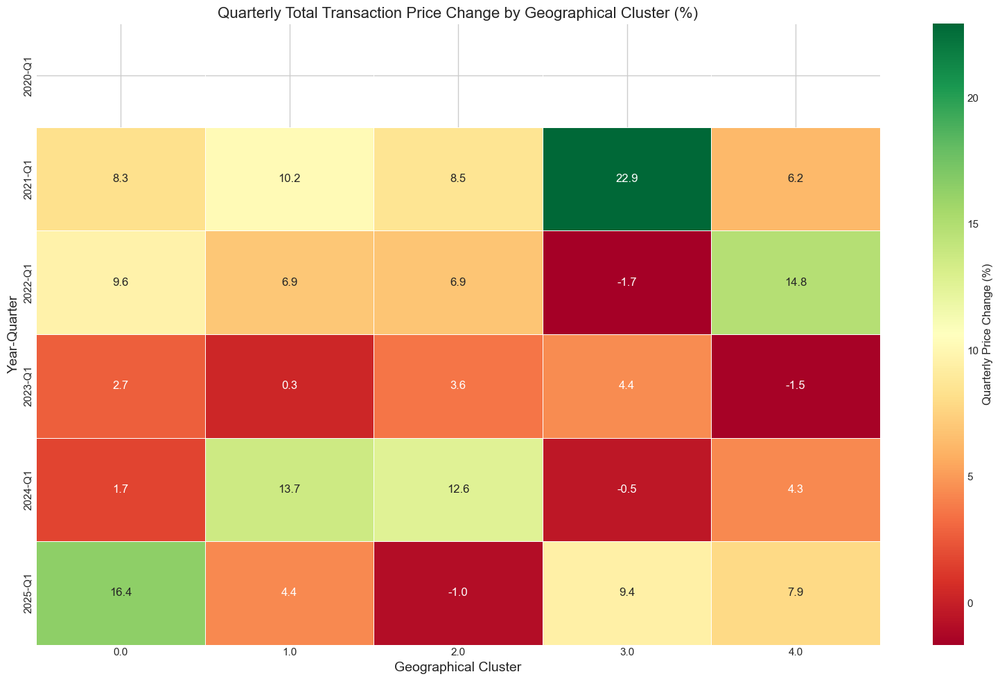

In [28]:
# select only coordinates for clustering
location_only = df[['longitude', 'latitude']].copy()

# standardise the data for clustering
location_scaler = StandardScaler()
location_only_scaled = location_scaler.fit_transform(location_only)

# k-means clustering with 5 clusters
k = 5  # num of clusters
kmeans_location = KMeans(n_clusters=k, random_state=42, n_init=10)
geo_clusters = kmeans_location.fit_predict(location_only_scaled)

# add labels to the original dataframe
df_geo_clusters = df.copy()
df_geo_clusters.loc[location_only.index, 'Geo Cluster'] = geo_clusters

# create a colored cluster map
fig_geo_location = px.scatter_mapbox(
    df_geo_clusters.dropna(subset=['Geo Cluster', 'latitude', 'longitude']), 
    lat='latitude', 
    lon='longitude', 
    color='Geo Cluster',
    color_continuous_scale=px.colors.qualitative.Bold, 
    size='Unit Price ($ PSF)',
    size_max=15, 
    zoom=10, 
    height=600, 
    width=800,
    title='Singapore Private Housing Clusters by Geographic Location Only'
)

fig_geo_location.update_layout(mapbox_style="carto-positron")
fig_geo_location.update_layout(margin={"r":0,"t":50,"l":0,"b":0})
fig_geo_location.show()

# price statistics for each cluster over time
# 1. price trends over time by cluster
geo_cluster_time = df_geo_clusters.groupby(['YearQuarter', 'Geo Cluster']).agg({
    'Price': ['mean', 'median', 'std', 'count'],
    'Unit Price ($ PSF)': ['mean', 'median', 'std']
}).reset_index()


geo_cluster_time.columns = ['_'.join(col).strip('_') if col[1] else col[0] for col in geo_cluster_time.columns.values]
# line chart for average transaction price by geographical cluster
fig_geo_price = px.line(
    geo_cluster_time, 
    x='YearQuarter', 
    y='Price_mean', 
    color='Geo Cluster',
    title='Average Transaction Price Trends by Geographical Cluster',
    labels={
        'Transacted Price ($)_mean': 'Average Transaction Price (SGD)', 
        'YearQuarter': 'Year-Quarter',
        'Geo Cluster': 'Geographical Cluster'
    },
    markers=True, 
    line_shape='linear', 
    template='plotly_white',
    height=600
)

fig_geo_price.update_layout(
    xaxis=dict(title="Time (Year-Quarter)", tickangle=45, type='category'),
    legend=dict(title="Geographical Cluster"),
    hovermode="x unified"
)

fig_geo_price.show()

# heatmap showing the quarterly price changes by cluster
# calculate the percentage change in price for each cluster
geo_cluster_pivot = geo_cluster_time.pivot(index='YearQuarter', columns='Geo Cluster', values='Price_mean')
geo_cluster_pct_change = geo_cluster_pivot.pct_change() * 100

plt.figure(figsize=(16, 10))
sns.heatmap(geo_cluster_pct_change, annot=True, fmt='.1f', cmap='RdYlGn', linewidths=.5, 
            cbar_kws={'label': 'Quarterly Price Change (%)'})
plt.title('Quarterly Total Transaction Price Change by Geographical Cluster (%)', fontsize=16)
plt.ylabel('Year-Quarter', fontsize=14)
plt.xlabel('Geographical Cluster', fontsize=14)
plt.tight_layout()
plt.show()

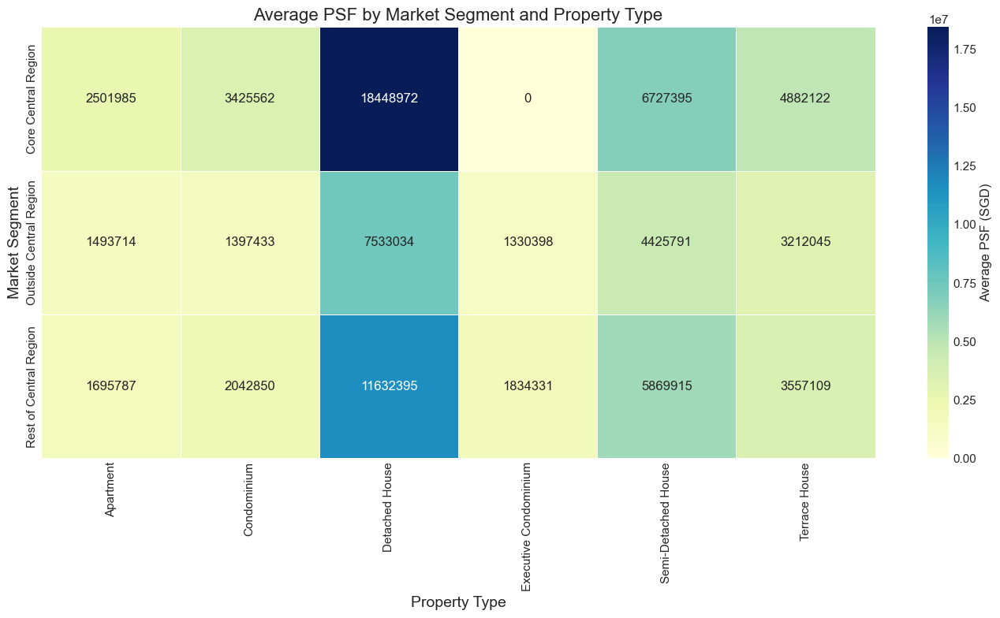

In [29]:
# multi-factor heatmap - market segment + property type + ave price
multi_factor = df.groupby(['Market Segment', 'Property Type'])['Price'].mean().unstack().fillna(0)

plt.figure(figsize=(14, 8))
sns.heatmap(multi_factor, annot=True, fmt='.0f', cmap='YlGnBu', linewidths=.5, cbar_kws={'label': 'Average PSF (SGD)'})
plt.title('Average PSF by Market Segment and Property Type', fontsize=16)
plt.ylabel('Market Segment', fontsize=14)
plt.xlabel('Property Type', fontsize=14)
plt.tight_layout()
plt.show()